In [6]:
import plotly.express as px
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import cv2 # For image operations
import random # for shuffling
from matplotlib import pyplot as plt, cm
import seaborn as sns
from pathlib import Path
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score

In [7]:
dataset_path = 'kvasir-dataset'
classes = ['dyed-lifted-polyps', 'dyed-resection-margins', 'esophagitis',
           'normal-cecum', 'normal-pylorus', 'normal-z-line', 'polyps', 'ulcerative-colitis']

In [8]:
class_images = {class_name: [] for class_name in classes}

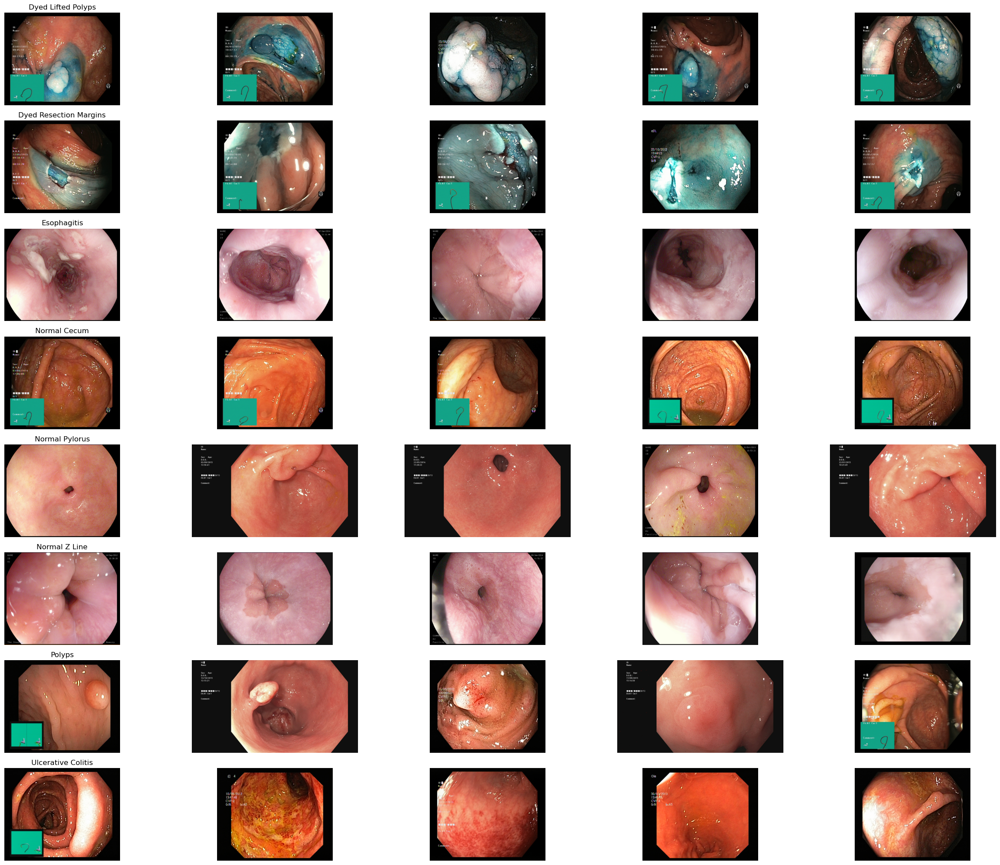

In [9]:
images_per_class = 5

# Number of classes
number_of_classes = 8

# Assuming the class directories are named as such:
class_names = [
    'dyed-lifted-polyps',
    'dyed-resection-margins',
    'esophagitis',
    'normal-cecum',
    'normal-pylorus',
    'normal-z-line',
    'polyps',
    'ulcerative-colitis'
]

# Set the size of the figure
plt.figure(figsize=(25, 20))

# Loop over each class
for i, class_name in enumerate(class_names):
    # Get the list of image files for the current class
    class_dir = os.path.join(dataset_path, class_name)
    image_files = [os.path.join(class_dir, img) for img in os.listdir(class_dir)[:images_per_class]]

    # Loop over each image file (limiting to the first `images_per_class`)
    for j, img_path in enumerate(image_files):
        # Load the image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert color to RGB

        # Plot the image
        plt.subplot(number_of_classes, images_per_class, i*images_per_class + j + 1)
        plt.imshow(img)
        plt.axis('off')  # Hide the axis
        if j == 0:
            plt.title(class_name.replace('-', ' ').title())  # Set the title for the first image in each row

# Show the plot
plt.tight_layout()
plt.show()

As we can see there are differences found between the different diseases found inside the intestinal tract,
The images present are of different size , so resizing  the images is important.

Since we are seeing different patterns , normalising the image using standard normalisation factor for color.(255.0)

In [10]:
def load_images_from_folder(class_name, n=400, image_size=(150, 150)):
    folder_path = os.path.join(dataset_path, class_name)
    images = []
    # Get the list of image file names
    filenames = [os.path.join(folder_path, filename) for filename in os.listdir(folder_path)]
    # Load the images
    for filename in tqdm(filenames[:n], desc=f'Loading {class_name}'):
        img = cv2.imread(filename)  # By default, OpenCV reads images in BGR format
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB format
        img = cv2.resize(img, image_size)
        img = img / 255.0  # Normalizing the image
        images.append(img)  # Do not flatten
    return images

In [11]:
for class_name in classes:
    class_images[class_name] = load_images_from_folder(class_name)

Loading ulcerative-colitis: 100%|████████████████████████████████████████████████████| 400/400 [00:05<00:00, 69.46it/s]


In [12]:
dyed_lifted_polyps = class_images['dyed-lifted-polyps']

In [13]:
len(dyed_lifted_polyps)

400

Each Class has 400 images loaded. Now defining each class into unique variable

In [14]:
dyed_resection_margins = class_images['dyed-resection-margins']
esophagitis=class_images['esophagitis']
normal_cecum=class_images['normal-cecum']
normal_pylorus=class_images['normal-pylorus']
normal_z_line=class_images['normal-z-line']
polyps=class_images['polyps']
ulcerative_colitis=class_images['ulcerative-colitis']

In [15]:
df = pd.DataFrame({
    'dataset': ['dyed_lifted_polyps', 'dyed_resection_margins', 'esophagitis', 'normal_cecum', 'normal_pylorus', 'normal_z_line', 'polyps', 'ulcerative_colitis'],
    'count_of_images': [len(dyed_lifted_polyps), len(dyed_resection_margins), len(esophagitis), len(normal_cecum), len(normal_pylorus), len(normal_z_line), len(polyps), len(ulcerative_colitis)]})

In [16]:
df

,dataset,count_of_images
0,dyed_lifted_polyps,400
1,dyed_resection_margins,400
2,esophagitis,400
3,normal_cecum,400
4,normal_pylorus,400
5,normal_z_line,400
6,polyps,400
7,ulcerative_colitis,400


In [17]:
fig = px.pie(df, values='count_of_images', names='dataset',
             color='dataset',
             color_discrete_sequence=px.colors.qualitative.Pastel,
             title='Distribution of Images Across Classes',
             hole=0.3)

fig.update_traces(textinfo='percent', showlegend=True)
fig.update_layout(legend_title_text='Gastro-Intestinal Diseases')

fig.show()

Creation of Dataset

In [18]:
np.random.seed(150) # Random seed to control the randomness of generated values
data = np.array(dyed_lifted_polyps + dyed_resection_margins + esophagitis + normal_cecum  + normal_pylorus + normal_z_line + polyps + ulcerative_colitis)  # Combining the list of images
labels = np.array([0]*400 + [1]*400 +[2]*400 +[3]*400 +[4]*400 +[5]*400 +[6]*400 +[7]*400) # creating class labels for the image classes
length = data.shape[0] # length of the data

# Shuffling the data and labels
indx = np.arange(length)
np.random.shuffle(indx)

data = data[indx]
labels = labels[indx]


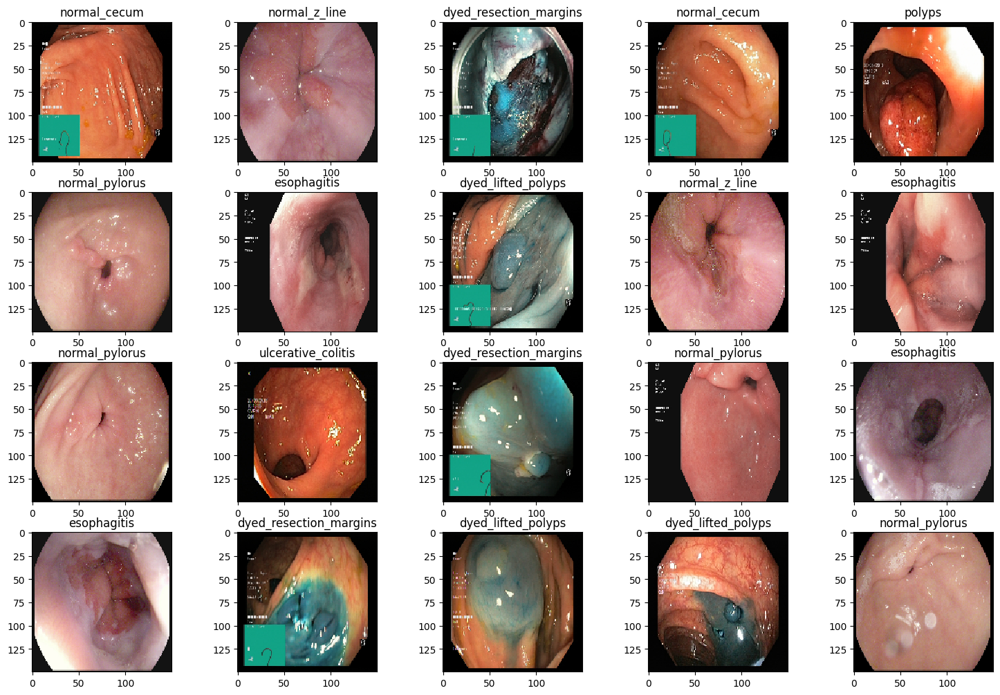

In [18]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 10))
fig.tight_layout() # add spacing between subplots
label = ['dyed_lifted_polyps', 'dyed_resection_margins', 'esophagitis', 'normal_cecum', 'normal_pylorus', 'normal_z_line', 'polyps', 'ulcerative_colitis']
for ax in axes.flat:
    y = np.random.randint(length)
    ax.imshow(np.asarray(data[y]), interpolation='nearest', cmap='gray')
    ax.set_title(label[labels[y]])

plt.show()

Train Test split

In [19]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, random_state=150, test_size=0.3, stratify=labels, shuffle=True)

Since the categories has class vectors we would be converting them to binary class matrices  using one-hot encoding

In [20]:
y_train_one = to_categorical(y_train)
y_test_one=to_categorical(y_test)

Now let us import the VGG16 Model from tensorflow libraries.

The archeitecture of VGG16 is given below:

- **16 Layers:** The "16" in VGG16 refers to it having 16 layers that have weights. This network contains 13 convolutional layers, 3 fully connected layers, and 5 MaxPooling layers.
- **Convolutional Layers:** The convolutional layers use 3x3 filters with a stride of 1 and are always followed by a ReLU activation function.
- **Max Pooling:** Max pooling is performed over a 2x2 pixel window, with stride 2.
- **Fully Connected Layers:** Three fully connected layers follow the convolutional layers. The first two have 4096 channels each, and the third performs 1000-way ILSVRC classification and thus contains 1000 channels (one for each class).
- **Final Layer:** The final layer is a softmax activation function that is used to output a distribution over the 1000 class labels.



In [21]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

In [22]:
# Load the base VGG16 model, pre-trained on ImageNet data
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [23]:
model = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='softmax')  #based on  dataset, there are 8 classes representing 8 different diseases
])

In [26]:
model.compile(optimizer=Adam(learning_rate=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [27]:
# Learning Rate Annealer
from keras.callbacks import ReduceLROnPlateau
lrr = ReduceLROnPlateau(monitor="val_accuracy", factor=0.01, patience=3, min_lr=1e-5)

In [28]:
history = model.fit(X_train, y_train_one,
                    batch_size=32,
                    epochs=10,
                    validation_data=(X_test, y_test_one),
                    callbacks=[lrr])

Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 203s 3s/step - accuracy: 0.1636 - loss: 2.2315 - val_accuracy: 0.4646 - val_loss: 1.7527 - learning_rate: 1.0000e-05
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 241s 3s/step - accuracy: 0.2902 - loss: 1.8528 - val_accuracy: 0.5667 - val_loss: 1.5017 - learning_rate: 1.0000e-05
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 257s 4s/step - accuracy: 0.4170 - loss: 1.5952 - val_accuracy: 0.6240 - val_loss: 1.3250 - learning_rate: 1.0000e-05
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 185s 3s/step - accuracy: 0.4763 - loss: 1.4091 - val_accuracy: 0.6531 - val_loss: 1.2021 - learning_rate: 1.0000e-05
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.5719 - loss: 1.2550 - val_accuracy: 0.6781 - val_loss: 1.1050 - learning_rate: 1.0000e-05
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 195s 3s/step - accuracy: 0.5862 - loss: 1.1749 - val_accuracy: 0.7052 - val_loss: 1.0248 - learning_rate: 1.0000e-05
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 230s 3s/step - accuracy: 0.5902 

In [29]:
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)

30/30 ━━━━━━━━━━━━━━━━━━━━ 90s 3s/step


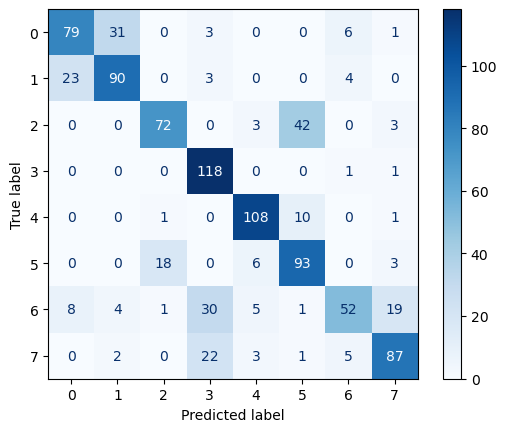

In [30]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Assuming y_test contains your true labels
y_true = np.argmax(y_test_one, axis=1)  # Convert one-hot to labels if y_test is one-hot encoded

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [31]:
from sklearn.metrics import precision_score, recall_score

precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')

print(f'Precision: {precision}')
print(f'Recall: {recall}')

Precision: 0.7372233949149047
Recall: 0.7281249999999999


ROC AUC Score: 0.9639608134920634


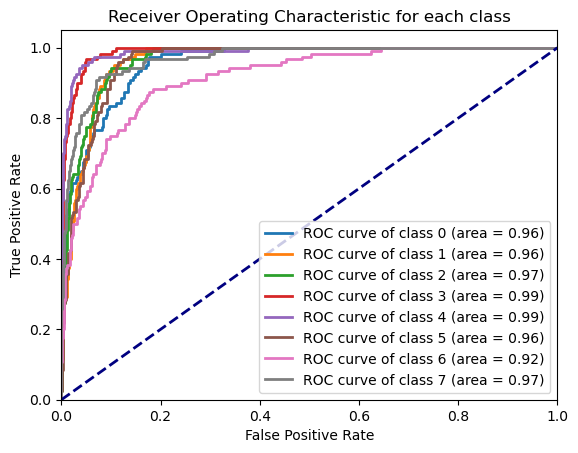

In [32]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize

y_test_binarized = label_binarize(y_true, classes=np.unique(y_true))

# Calculate AUC for each class
roc_auc = roc_auc_score(y_test_binarized, y_pred_proba, multi_class='ovr')

print(f'ROC AUC Score: {roc_auc}')

# Plot ROC curve for each class
n_classes = y_test_binarized.shape[1]
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plotting
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for each class')
plt.legend(loc="lower right")
plt.show()

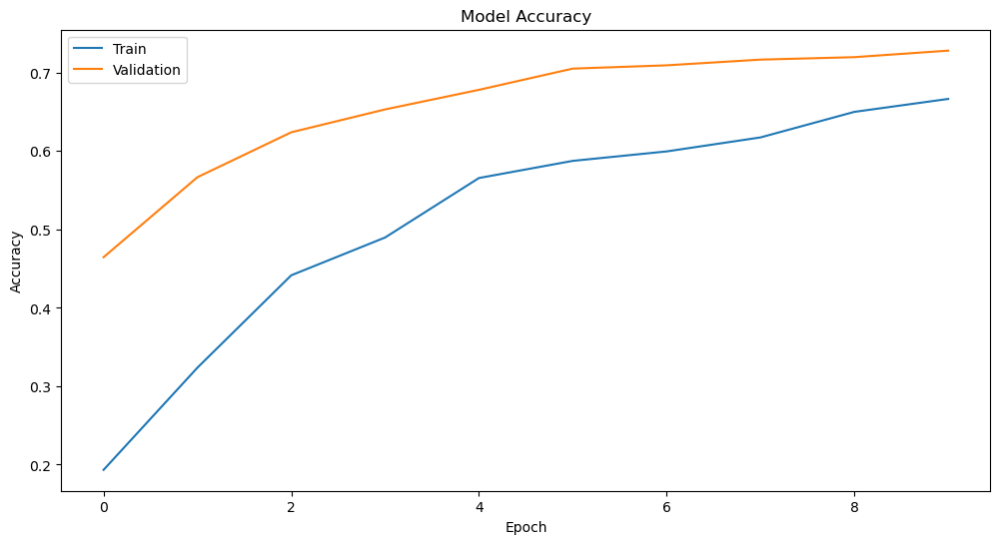

In [33]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

plt.figure(figsize=(12, 6))
plt.plot(acc, label='Train')
plt.plot(val_acc, label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

In [34]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (32, 4, 4, 512)             │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (32, 8192)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (32, 256)                   │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (32, 256)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (32, 8)                     │           2,056 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,013,082 (80.16 MB)

 Trainable params: 2,099,464 (8.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 4,198,930 (16.02 MB)

In [35]:
model.save('VGG16.keras')